# Mixin: Music Annotation Exploratory Analysis

# Table of Contents
1. [Overview of Mixin Project](#Overview-of-Mixin-Project)
2. [Current Stage: Automated Chorus Identification](#Current-Stage:-Automated-Chorus-Identification)
3. [Exploratory Analysis](#Exploratory-Analysis)
    - [Data Profile](#Data-Profile)
    - [Label Validation](#Label-Validation)
    - [Audio Feature Generation & Visualization](#Audio-Feature-Generation-&-Visualization)
    - [Insights and Findings](#Insights-and-Findings)

---

# Overview of the Mixin Project
#### The Quest for an AI DJ

The year is 2024. Rapid developments in technology have revived a question that scholars have contemplated for eons: *Can I teach my computer how to DJ?*

The Mixin project aims to develop an autonomous DJ system that can select songs from an input playlist and arrange them into seamless, continuous mix—a feat traditionally reserved for carbon-based disc jockeys. 

#### Project Stages and Objectives
 **1) Automated Chorus Identification:** Accurately identify the parts of a song to play, skip, or use for transitions.
 
 **2) Algorithmic Song Selection:** Design an algorithm to assemble the optimal sequence of tracks that creates a smooth, natural flow based on features like keys, tempos, and energies.
 
 **3) Transition Engineering:** Leverage audio signal processing and music theory to design transitions that are audibly indistinguishable from those performed by a skilled human DJ.



# Current Stage: Automated Chorus Identification
The essence of DJing revolves around the art of storytelling through music. The narrative is sculpted not just by the selection of music, but by the mastery over which sections of a song are played or mixed. In this context, the ability to discern which musical segments to play, skip, or use for transitions is an essential skill for all DJs. Similarly, the ability to set, save, and recall cue points is an industry standard feature for DJ softwares. This process resembles the traditional vinyl DJ practice of setting cue points - physical stickers placed on records to mark significant moments. This practice requires a deep familiarity with each track and strategic foresight into how each segment could be woven into the broader narrative of the set. For an AI DJ system, the challenge is to embed this nuanced understanding of musical structure and emotional progression into algorithms capable of analyzing audio features. The current stage aims to develop an automated method to locate the beginning and end of core thematic segments (i.e. choruses) in a song.



# Exploratory Analysis
The exploratory data analysis in this stage will consist of:
- Data Profiling
- Label Validation & Hypothesis Testing
- Audio Feature Generation & Visualization

## Data Profile

---

### Load the Dataset

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import librosa

# Enable inline plotting in Jupyter notebooks
%matplotlib inline

# Setting custom dimensions for Pandas display
pd.set_option('display.max_columns', None)  # This shows all columns
pd.set_option('display.max_colwidth', 15) 

# Load the dataset
df = pd.read_csv('../data/dataframes/clean_labeled.csv', dtype={'SongID': object})

# Display the first few rows of the dataframe
df.head()

,SongID,start_time,end_time,start_frame,end_frame,label,TrackName,Artists,Genre,FilePath,sp_danceability,sp_energy,sp_key,sp_loudness,sp_speechiness,sp_acousticness,sp_instrumentalness,sp_liveness,sp_valence,sp_tempo,sp_time_signature,sp_genre,sampling_rate
0,1,0.0,61.000000,0,5718,other,Bass Inside,AC Slater,Bass House,..\data\aud...,0.905,0.838,6.0,-6.838,0.0499,0.00112,0.839,0.608,0.464,126.007,4.0,electro hou...,48000
1,1,61.0,121.900000,5718,11428,chorus,Bass Inside,AC Slater,Bass House,..\data\aud...,0.905,0.838,6.0,-6.838,0.0499,0.00112,0.839,0.608,0.464,126.007,4.0,electro hou...,48000
2,1,121.9,167.700000,11428,15721,other,Bass Inside,AC Slater,Bass House,..\data\aud...,0.905,0.838,6.0,-6.838,0.0499,0.00112,0.839,0.608,0.464,126.007,4.0,electro hou...,48000
3,1,167.7,228.600000,15721,21431,chorus,Bass Inside,AC Slater,Bass House,..\data\aud...,0.905,0.838,6.0,-6.838,0.0499,0.00112,0.839,0.608,0.464,126.007,4.0,electro hou...,48000
4,1,228.6,259.995011,21431,24374,other,Bass Inside,AC Slater,Bass House,..\data\aud...,0.905,0.838,6.0,-6.838,0.0499,0.00112,0.839,0.608,0.464,126.007,4.0,electro hou...,48000


### Dataset Overview

---

In [2]:
def get_summary(df):
    """Generates a summary dataframe with descriptive statistics and example values."""
    # Add example value for all columns (numeric and non-numeric)
    example_value = df.apply(lambda x: np.random.choice(x.dropna().values) 
                             if not x.dropna().empty else np.nan)
    
    # Construct the initial summary dataframe with general info
    summary_df = pd.DataFrame({
        'Non-NA Count': df.notna().sum(),
        'NA Count': df.isna().sum(),
        'Unique Values': df.nunique(dropna=False),
        'Data Type': df.dtypes,
        'Example Value': example_value
    })
    
    # Compute descriptive statistics for numeric columns and merge with summary_df
    summary_df = summary_df.join(df.describe().T.rename(columns={
        'mean': 'Mean', 'std': 'Std', 'min': 'Min',
        '25%': '25th Percentile', '50%': 'Median',
        '75%': '75th Percentile', 'max': 'Max'
    }), how='left')
    
    return summary_df

get_summary(df)

,Non-NA Count,NA Count,Unique Values,Data Type,Example Value,count,Mean,Std,Min,25th Percentile,Median,75th Percentile,Max
SongID,1815,0,332,object,350,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
start_time,1815,0,884,float64,211.6,1815.0,94.596088,69.411400,0.000000,34.85000,92.1000,150.000000,301.200000
end_time,1815,0,1202,float64,261.2,1815.0,131.444524,65.181639,0.200000,76.40000,133.9000,180.168526,381.109025
start_frame,1815,0,884,int64,17418,1815.0,8868.025895,6507.211159,0.000000,3266.50000,8634.0000,14062.000000,28237.000000
end_frame,1815,0,1188,int64,13059,1815.0,12322.476584,6110.769424,18.000000,7162.00000,12553.0000,16890.500000,35728.000000
label,1815,0,2,object,other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TrackName,1815,0,331,object,imaginary f...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Artists,1815,0,275,object,"Shiba San, ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Genre,1608,207,62,object,Bass House,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
FilePath,1815,0,332,object,..\data\aud...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Distribution of Labels

---

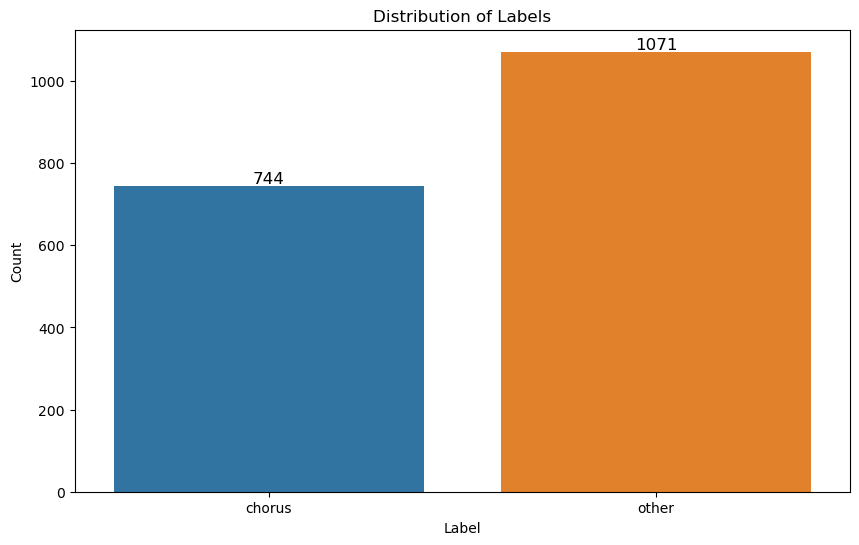

In [3]:
# Plotting the distribution of labels with annotated counts
plt.figure(figsize=(10, 6))
ax = sns.countplot(x='label', data=df, order=['chorus', 'other'])
ax.set_title('Distribution of Labels')
ax.set_xlabel('Label')
ax.set_ylabel('Count')

# Annotating bars with label counts
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=12, color='black', xytext=(0, 5),
                textcoords='offset points')

plt.show()

### Number of Labeled Chorus Segments per Song

---

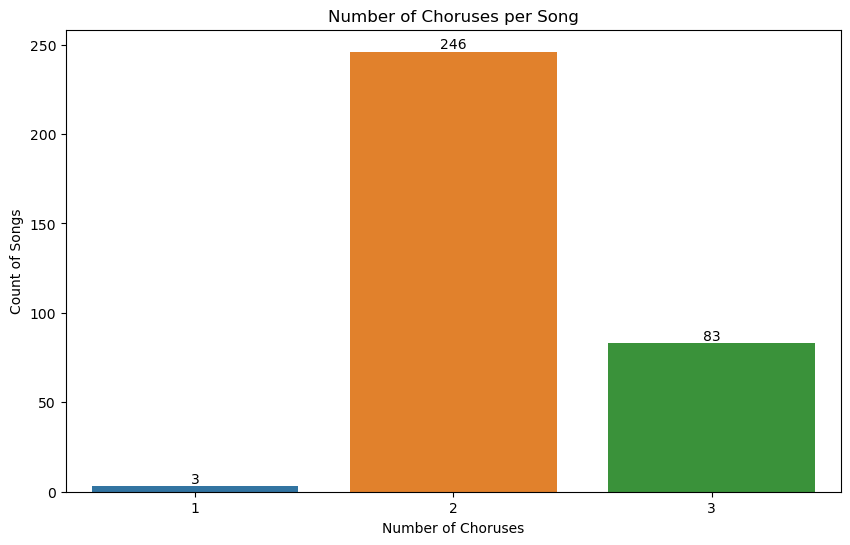

In [4]:
# Plotting the number of choruses per song with annotated counts
choruses_per_song = df[df['label'] == 'chorus'].groupby('SongID').size()
plt.figure(figsize=(10, 6))
ax = sns.countplot(x=choruses_per_song)
ax.set_title('Number of Choruses per Song')
ax.set_xlabel('Number of Choruses')
ax.set_ylabel('Count of Songs')

# Annotating bars with count of songs
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                textcoords='offset points')

plt.show()

### Distribution of Chorus Lengths

---

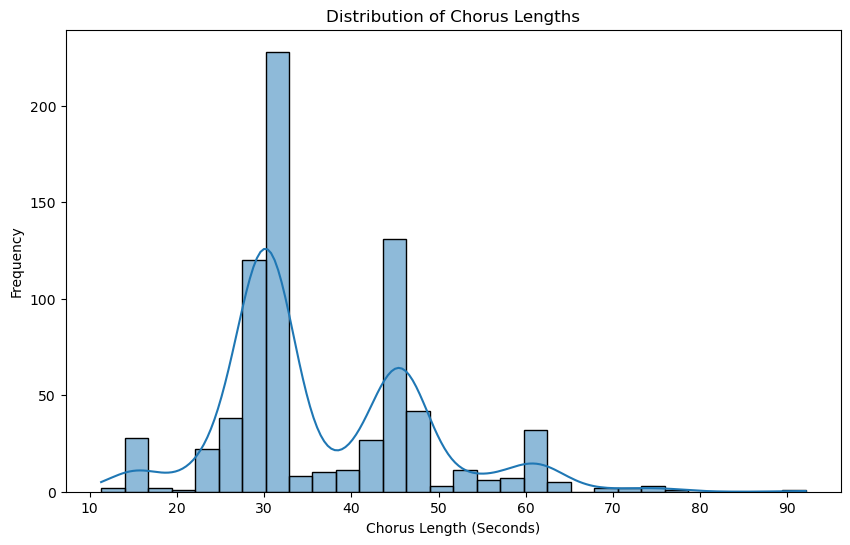

In [5]:
# Plotting the distribution of chorus lengths
df['chorus_length'] = np.where(df['label'] == 'chorus', df['end_time'] - df['start_time'], 0)
plt.figure(figsize=(10, 6))
ax = sns.histplot(df.loc[df['chorus_length'] > 0, 'chorus_length'], bins=30, kde=True)
ax.set_title('Distribution of Chorus Lengths')
ax.set_xlabel('Chorus Length (Seconds)')
ax.set_ylabel('Frequency')
plt.show()

### Distribution of Chorus Positions within Tracks

---


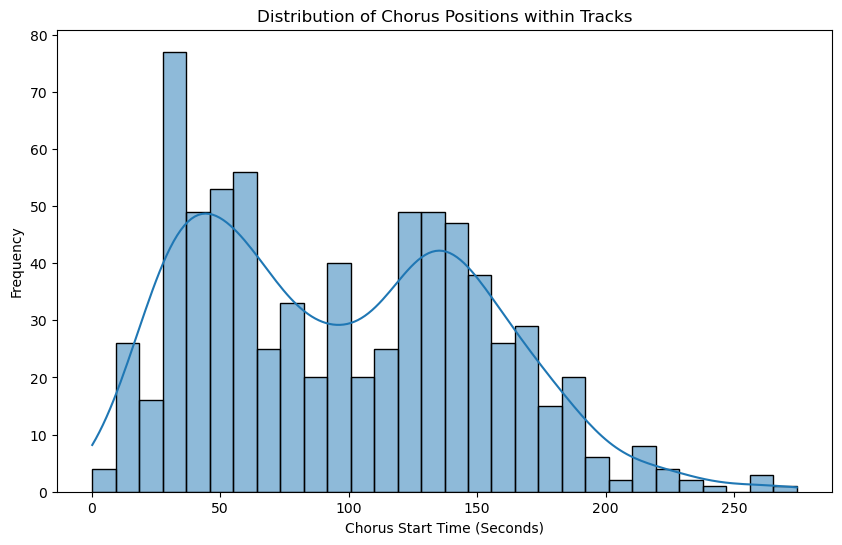

In [6]:
# Plotting the distribution of chorus start times within tracks
plt.figure(figsize=(10, 6))
ax = sns.histplot(df.loc[df['label'] == 'chorus', 'start_time'], bins=30, kde=True)
ax.set_title('Distribution of Chorus Positions within Tracks')
ax.set_xlabel('Chorus Start Time (Seconds)')
ax.set_ylabel('Frequency')
plt.show()

### Song-level Analyses using Spotify Features 

---

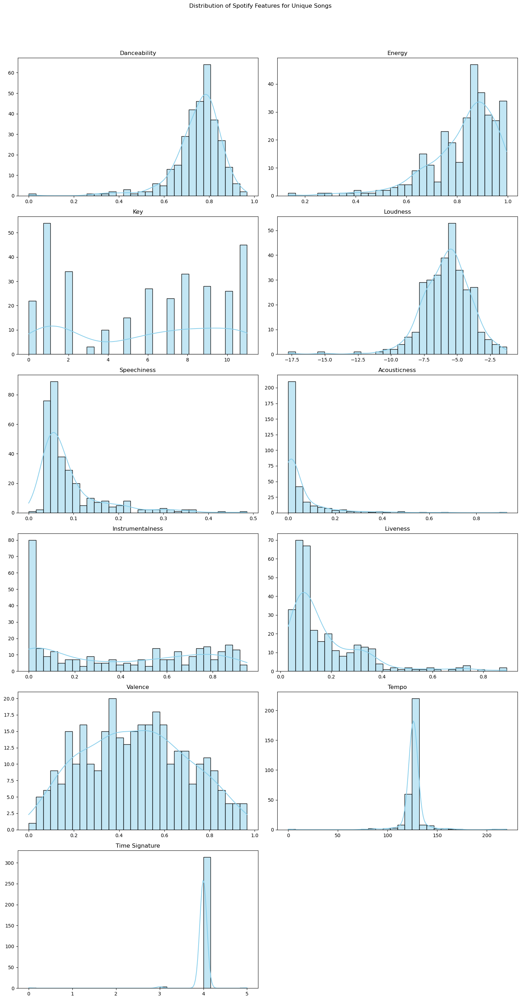

In [7]:
song_level_df = df.copy()
song_level_df = song_level_df.drop_duplicates(subset=['SongID'])
spotify_features = [col for col in song_level_df.columns if col.startswith('sp_') and col != 'sp_genre']
# Calculate the number of rows needed for subplots
nrows = (len(spotify_features) + 1) // 2
ncols = 2

# Create a figure with subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 5 * nrows))
fig.suptitle("Distribution of Spotify Features for Unique Songs")

# Flatten the axes array for easy indexing
axes = axes.flatten()

# Loop through the features and create histograms
for i, feature in enumerate(spotify_features):
    sns.histplot(song_level_df[feature], ax=axes[i], bins=30, kde=True, color='skyblue', edgecolor='black')
    axes[i].set_title(feature.replace('sp_', '').replace('_', ' ').title())
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')

# Hide any unused subplots
for j in range(i + 1, nrows * ncols):
    axes[j].set_visible(False)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust the layout to make room for the main title
plt.show()

### Genre-level Exploratory Analysis

---

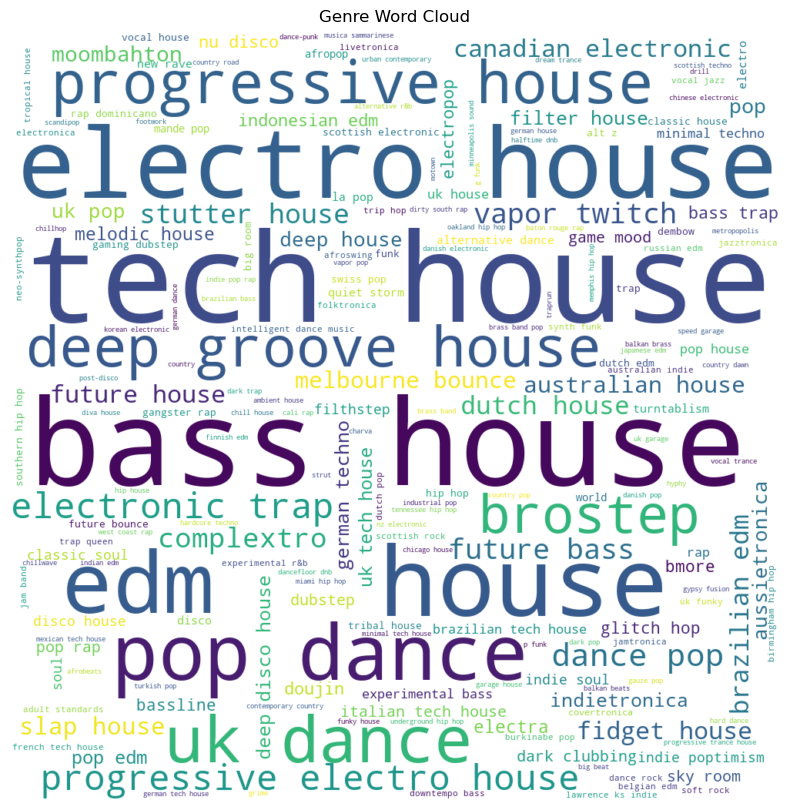

In [8]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Prepare the data for the word cloud and the bar chart
df_genres = df.copy()
df_genres['sp_genre'] = df_genres['sp_genre'].apply(lambda x: x.split(', ') if isinstance(x, str) else [])
all_genres = [genre for sublist in df_genres['sp_genre'] for genre in sublist]
genre_counts = pd.Series(all_genres).value_counts()
popular_genres = genre_counts[genre_counts >= 5]

# Create a word cloud of popular genres
wordcloud = WordCloud(width=1000, height=1000, background_color='white').generate_from_frequencies(popular_genres)

# Count unique artists associated with each genre
genre_artist_counts = {genre: df_genres[df_genres['sp_genre'].apply(lambda x: genre in x)]['Artists'].str.split('/').explode().nunique() 
                       for genre in genre_counts.index}
sorted_genre_artist_counts = dict(sorted(genre_artist_counts.items(), key=lambda item: item[1], reverse=True)[:50])

# Plot the word cloud 
plt.figure(figsize=(12, 10)) 
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Hide the axes
plt.title('Genre Word Cloud')
plt.show()

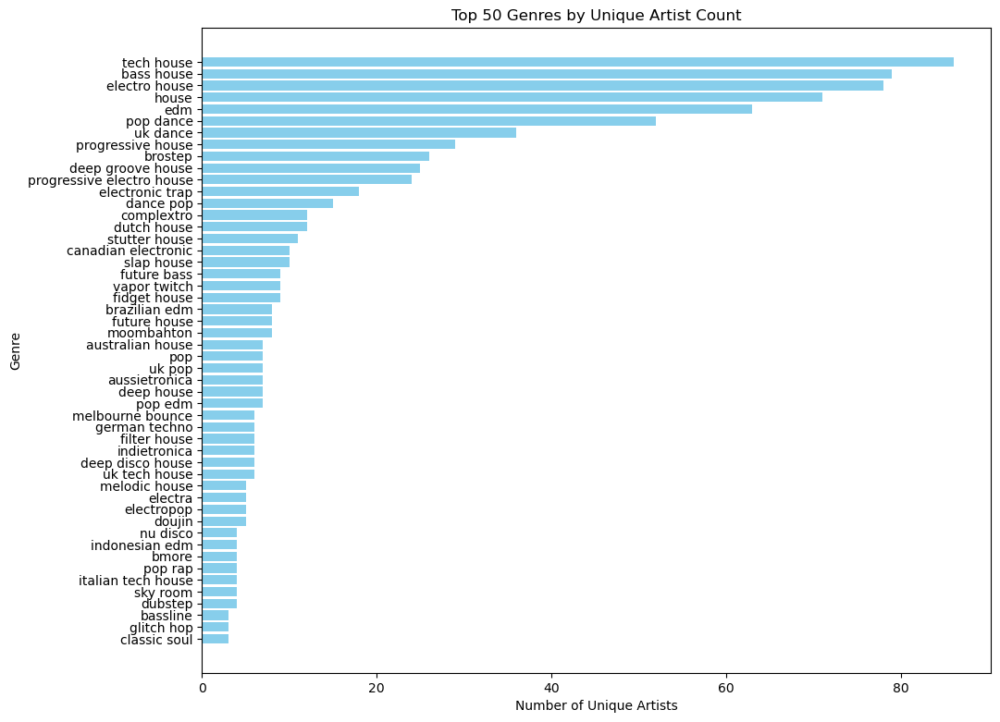

In [9]:
# Create a new figure for the bar chart
plt.figure(figsize=(12, 9))  # Adjust the size as needed
plt.barh(list(sorted_genre_artist_counts.keys()), list(sorted_genre_artist_counts.values()), color='skyblue')
plt.xlabel('Number of Unique Artists')
plt.ylabel('Genre')
plt.title('Top 50 Genres by Unique Artist Count')
plt.gca().invert_yaxis()  # Invert the y-axis to have the largest values on top
plt.tight_layout(pad=5)
plt.show()

### Genre Association Network

---

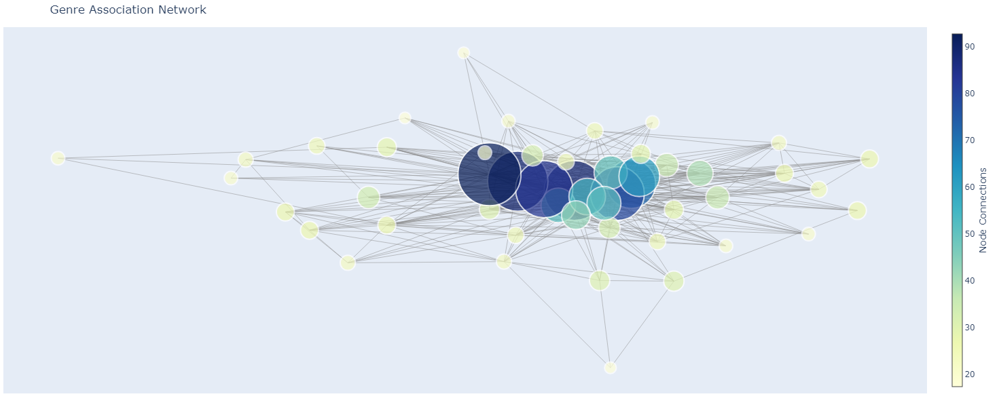

In [10]:
import networkx as nx
import math
import plotly.graph_objs as go

# Initialize graph and get top genres
G = nx.Graph()
top_genres = list(sorted_genre_artist_counts.keys())[:50]  

# Build genre-artist associations
genre_artist_counts = {}
for genres, artists in df_genres[df_genres['sp_genre'].apply(lambda x: any(g in x for g in top_genres))][['sp_genre', 'Artists']].values:
    artists_set = set(artists.split('/'))
    for genre in genres:
        if genre in top_genres:
            genre_artist_counts.setdefault(genre, set()).update(artists_set)

# Add nodes based on genre artist counts
for genre, artists in genre_artist_counts.items():
    G.add_node(genre, size=len(artists))

# Add edges between genres sharing artists
for genres in df_genres['sp_genre']:
    for genre1 in genres:
        for genre2 in genres:
            if genre1 in top_genres and genre2 in top_genres and genre1 != genre2:
                weight = 1 + G[genre1][genre2]['weight'] if G.has_edge(genre1, genre2) else 1
                G.add_edge(genre1, genre2, weight=weight)

# Layout calculation and edge/node extraction
pos = nx.spring_layout(G, k=0.3, iterations=50)
edge_x, edge_y = [], []
for edge in G.edges():
    x0, y0, x1, y1 = *pos[edge[0]], *pos[edge[1]]
    edge_x.extend([x0, x1, None])
    edge_y.extend([y0, y1, None])

node_x, node_y = zip(*[pos[node] for node in G.nodes()])
node_sizes = [10 * math.sqrt(G.nodes[node]['size']) for node in G.nodes()]

# Plot configuration
edge_trace = go.Scatter(x=edge_x, y=edge_y, line=dict(width=0.5, color='#888'), mode='lines', hoverinfo='none')
node_trace = go.Scatter(x=node_x, y=node_y, mode='markers', hoverinfo='text', marker=dict(
    showscale=True, colorscale='YlGnBu', size=node_sizes, color=node_sizes, line_width=2,
    colorbar=dict(thickness=15, title='Node Connections', xanchor='left', titleside='right')))

node_trace.text = [f'{node}: {G.nodes[node]["size"]} artists' for node in G.nodes()]

fig = go.Figure(data=[edge_trace, node_trace], layout=go.Layout(
    title='Genre Association Network', showlegend=False, hovermode='closest',
    margin=dict(b=20, l=5, r=5, t=40), xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False), width=800, height=600))

fig.show()


### Spotify Audio Features Averaged by Genre

---

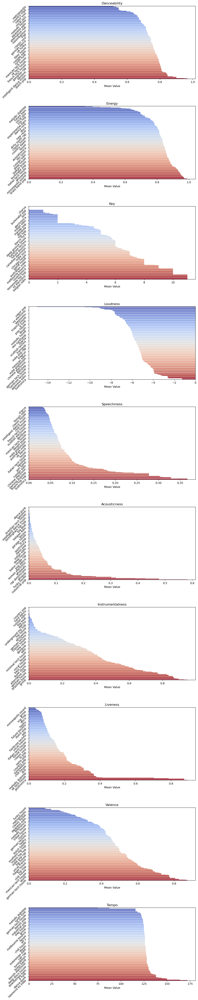

In [12]:
# Exploding the 'sp_genre' column
df_exploded = df.assign(sp_genre=df['sp_genre'].apply(lambda x: x.split(', ') if isinstance(x, str) else [])).explode('sp_genre')

# Calculate mean of features by genre
features = [
    'sp_danceability', 'sp_energy', 'sp_key', 'sp_loudness', 
    'sp_speechiness', 'sp_acousticness', 'sp_instrumentalness', 
    'sp_liveness', 'sp_valence', 'sp_tempo'
]
genre_features = df_exploded.groupby('sp_genre')[features].mean().reset_index()

# Determine the number of rows for subplots
nrows = len(features)

# Create a large figure to accommodate all subplots
plt.figure(figsize=(10, 5 * nrows))

# Loop through the features and create a subplot for each
for i, feature in enumerate(features):
    plt.subplot(nrows, 1, i + 1)
    sorted_data = genre_features.sort_values(by=feature, ascending=True)
    sns.barplot(x=feature, y='sp_genre', data=sorted_data, palette='coolwarm')
    plt.title(feature.split('_')[1].capitalize())
    plt.xlabel('Mean Value')
    plt.ylabel('')

    # Select every 10th label and rotate them
    selected_indices = np.arange(0, len(sorted_data), 10)
    selected_labels = sorted_data.iloc[selected_indices]['sp_genre']
    plt.yticks(selected_indices, selected_labels, rotation=45)

plt.tight_layout()
plt.show()

## Label Validation

---

In this section, we aim to evaluate the quality of manually labeled chorus segments, tempo estimation methods, and beat-grid generation algorithms.

It's important to note that this evaluation is conducted in the absence of an external ground truth for direct comparison. Instead, we are banking on the hypothesis that a strong alignment between the chorus labels and an independently generated beat-grid and tempo estimation signifies proximity to what would be considered the "true" structure of the song. This alignment-based approach to validation assumes that both the manual labeling process and the algorithmic estimations accurately capture the essential features of the music, thereby enabling the autonomous DJ system to perform seamlessly. To this end, we will also A/B test various parameter estimation methods to see which one yields the best alignment with chorus labels.

### Methodology

1. **Manual Labeling of Choruses:** Choruses were manually labeled such that the start aligns with the first downbeat of the initial bar, while the end follows the last downbeat of the final bar. Refer to the [Mixin Data Annotation Guide](https://docs.google.com/document/d/1NorWU7DheD0gmgCQtoegtga73mRPj3a_B4EIB_Ppnvc/edit?usp=sharing) for the full criteria and methodology. The chorus endpoints can be used to derive a beat grid, whose quality we can assess through its proximity to chorus start/end markers. Close alignment between labels and bar grid indices would suggest consistent labeling per the operational definiition. 
2. **Tempo Estimation**: Tempo is an important parameter that should be estimated as accurately as possible, as it will be used to to generate a beat and bar grid, which can then be used to partition songs into meaningful units for modeling and mixing. 
3. **Assumptions & Hypothesis**: 
- To examine whether our labels are consistent with our operational definition, we hypothesize that the chorus start and end timestamps are located on or within an acceptable distance from an index in the bar grid. In other words, a chorus should be fully encapsulated in between two bar indices.  
- We also use this opportunity to test various tempo estimation methods and grid generating algorithms under the assumption that tempos and grids closer to ground truth will result in a closer alignment between labels and bar indices. 

### Load Data

In [1]:
import numpy as np
import pandas as pd
import librosa
from tqdm.auto import tqdm
from math import floor, sqrt
from scipy.stats import pearsonr
from scipy.signal import correlate

# Load the dataset
file_path = '../data/dataframes/clean_labeled.csv'  
df = pd.read_csv(file_path)

df.head()

,SongID,start_time,end_time,start_frame,end_frame,label,TrackName,Artists,Genre,FilePath,...,sp_loudness,sp_speechiness,sp_acousticness,sp_instrumentalness,sp_liveness,sp_valence,sp_tempo,sp_time_signature,sp_genre,sampling_rate
0,1,0.0,61.000000,0,5718,other,Bass Inside,AC Slater,Bass House,..\data\audio_files\processed\1.mp3,...,-6.838,0.0499,0.00112,0.839,0.608,0.464,126.007,4.0,"electro house, brostep, bass house, fidget house",48000
1,1,61.0,121.900000,5718,11428,chorus,Bass Inside,AC Slater,Bass House,..\data\audio_files\processed\1.mp3,...,-6.838,0.0499,0.00112,0.839,0.608,0.464,126.007,4.0,"electro house, brostep, bass house, fidget house",48000
2,1,121.9,167.700000,11428,15721,other,Bass Inside,AC Slater,Bass House,..\data\audio_files\processed\1.mp3,...,-6.838,0.0499,0.00112,0.839,0.608,0.464,126.007,4.0,"electro house, brostep, bass house, fidget house",48000
3,1,167.7,228.600000,15721,21431,chorus,Bass Inside,AC Slater,Bass House,..\data\audio_files\processed\1.mp3,...,-6.838,0.0499,0.00112,0.839,0.608,0.464,126.007,4.0,"electro house, brostep, bass house, fidget house",48000
4,1,228.6,259.995011,21431,24374,other,Bass Inside,AC Slater,Bass House,..\data\audio_files\processed\1.mp3,...,-6.838,0.0499,0.00112,0.839,0.608,0.464,126.007,4.0,"electro house, brostep, bass house, fidget house",48000


---

### Functions

In [430]:
def beat_tracking_dp(y, sr, onset_env=None,hop_length=512, alpha=0.5):
    """Perform beat tracking using dynamic programming."""
    tempo_estimate, _ = librosa.beat.beat_track(y=y, sr=sr)
    floor_tempo = floor(tempo_estimate)
    tempo_hypotheses = [floor_tempo - 1, floor_tempo, tempo_estimate, floor_tempo + 1]
    tempo_hypotheses = np.unique(tempo_hypotheses)

    if onset_env is None:
        onset_env = librosa.onset.onset_strength(y=y, sr=sr, hop_length=hop_length)
    time_step = hop_length / sr
    time_grid = np.arange(len(onset_env)) * time_step
    C = np.zeros((len(onset_env), len(tempo_hypotheses)))
    P = np.zeros_like(C, dtype=int)

    for i, t in enumerate(time_grid[1:], 1):
        for k, tempo in enumerate(tempo_hypotheses):
            tau_p = 60 / tempo
            start = max(0, i - int(2 * tau_p / time_step))
            end = max(0, i - int(tau_p / (2 * time_step)))
            if start < end:
                transition_scores = C[start:end, k] - alpha * (np.log((t - time_grid[start:end]) / tau_p))**2
                best_predecessor = start + np.argmax(transition_scores)
                max_score = transition_scores[best_predecessor - start]
            else:
                best_predecessor = 0
                max_score = 0
            C[i, k] = onset_env[i] + max_score
            P[i, k] = best_predecessor

    best_tempo_index = np.argmax(C[-1])
    best_bpm = tempo_hypotheses[best_tempo_index]

    # Backtrace to recover the beat sequence
    beat_frames = [len(onset_env) - 1]  # Start from the last frame
    current_frame = beat_frames[-1]

    while current_frame > 0:
        current_frame = P[current_frame, best_tempo_index]
        beat_frames.append(current_frame)

    beat_frames.pop()  # Remove the last appended frame which is zero due to initialization
    beat_frames.reverse()  # Reverse the beat frames to be in chronological order

    return best_bpm, beat_frames

def adjust_tempo_values(*tempo_values):
    """Adjusts tempo values based on specified logic."""
    adjusted_tempos = []
    for tempo in tempo_values:
        if tempo > 140:
            adjusted_tempos.append(tempo / 2)
        elif tempo < 70:
            adjusted_tempos.append(tempo * 2)
        else:
            adjusted_tempos.append(tempo)
    return adjusted_tempos

def generate_beats_and_bars(first_beat_time, tempo, time_signature_num, duration):
    """Generate beat and measure grids within the duration of a song."""
    seconds_per_beat = 60.0 / tempo
    beats_per_measure = time_signature_num
    seconds_per_measure = seconds_per_beat * beats_per_measure

    # Generate beat grid forward
    beat_grid_forward = [first_beat_time + i * seconds_per_beat for i in range(int((duration - first_beat_time) / seconds_per_beat))]
    
    # Generate beat grid backward
    beat_grid_backward = [first_beat_time - i * seconds_per_beat for i in range(1, int(first_beat_time / seconds_per_beat) + 1)]
    beat_grid_backward.reverse()

    # Combine beat grids
    beat_grid = beat_grid_backward + beat_grid_forward

    # Generate measure grid forward
    measure_grid_forward = [first_beat_time + i * seconds_per_measure for i in range(int((duration - first_beat_time) / seconds_per_measure))]
    
    # Generate measure grid backward
    measure_grid_backward = [first_beat_time - i * seconds_per_measure for i in range(1, int(first_beat_time / seconds_per_measure) + 1)]
    measure_grid_backward.reverse()

    # Combine measure grids
    measure_grid = measure_grid_backward + measure_grid_forward

    return beat_grid, measure_grid

def optimize_measure_grid(measure_grid, beat_grid, tempo, duration):
    """Optimizes the measure grid to better align with the beat grid within constraints."""
    max_adjustment = (60 / (3 * tempo))
    
    if len(measure_grid) < 2:
        return measure_grid

    original_seconds_per_measure = measure_grid[1] - measure_grid[0]
    optimized_measure_grid = measure_grid[:]

    for i in range(len(optimized_measure_grid) - 1):
        best_adjustment = 0
        min_distance_sum = float('inf')

        for adjustment in np.linspace(-max_adjustment, max_adjustment, 100):
            predicted_end = optimized_measure_grid[i] + adjustment + original_seconds_per_measure * (len(optimized_measure_grid) - i - 1)
            if predicted_end > duration:
                continue

            distance_sum = sum(min(abs(beat_time - (optimized_measure_grid[i] + adjustment + k * original_seconds_per_measure)) for k in range(len(optimized_measure_grid) - i)) for beat_time in beat_grid)

            if distance_sum < min_distance_sum:
                min_distance_sum = distance_sum
                best_adjustment = adjustment

        for j in range(i, len(optimized_measure_grid)):
            optimized_measure_grid[j] += best_adjustment
            if optimized_measure_grid[j] > duration:
                optimized_measure_grid = optimized_measure_grid[:j + 1]
                break

    return optimized_measure_grid


---

### Preprocessing Loop to Generate Beat and Bar Grids

In [431]:
from tqdm.auto import tqdm
import pandas as pd
import librosa

# Initialize results list
results = []

# Loop through each unique SongID in the DataFrame
for song_id in tqdm(df['SongID'].unique(), desc="Processing..."):
    data = df.loc[df['SongID'] == song_id]
    audio_path = f'../data/audio_files/processed/{song_id}.mp3'
    y, sr = librosa.load(audio_path, sr=None)
    duration = librosa.get_duration(y=y, sr=sr)
    onset_env = librosa.onset.onset_strength(y=y, sr=sr)
    
    # Beat tracking with custom function
    tempo, beats = beat_tracking_dp(y, sr=sr, onset_env=onset_env, hop_length=512)
    
    # Librosa's beat tracking
    lib_tempo, lib_beats = librosa.beat.beat_track(y=y, sr=sr, hop_length=512)
    
    # Spotify's tempo, if available, else fallback to Librosa's estimate
    sp_tempo = data['sp_tempo'].iloc[0] if not pd.isnull(data['sp_tempo'].iloc[0]) else lib_tempo
    
    # Adjust tempo values as needed
    tempo, lib_tempo, sp_tempo = adjust_tempo_values(tempo, lib_tempo, sp_tempo)
    
    # Time signature handling
    time_signature = data['sp_time_signature'].iloc[0] if not pd.isnull(data['sp_time_signature'].iloc[0]) else 4
    time_signature = int(time_signature) if time_signature != 0 else 4
    
    # Beat times
    beat_times = librosa.frames_to_time(beats, sr=sr, hop_length=512)
    lib_beat_times = librosa.frames_to_time(lib_beats, sr=sr, hop_length=512)
    
    # Beat and bar grids
    beat_grid, bar_grid = generate_beats_and_bars(beat_times[0], tempo, time_signature, duration) 
    lib_beat_grid, lib_bar_grid = generate_beats_and_bars(lib_beat_times[0], lib_tempo, time_signature, duration) 
    sp_beat_grid, sp_bar_grid = generate_beats_and_bars(lib_beat_times[0], sp_tempo, time_signature, duration) 
    
    # Appending results for each song
    results.append({
        "song_id": song_id,
        "duration": duration,
        "time_signature": time_signature,
        "tempo": tempo,
        "lib_tempo": lib_tempo,
        "sp_tempo": sp_tempo,
        "beat_grid": beat_grid,
        "lib_beat_grid": lib_beat_grid,
        "sp_beat_grid": sp_beat_grid,
        "bar_grid": bar_grid,
        "lib_bar_grid": lib_bar_grid,
        "sp_bar_grid": sp_bar_grid
    })

# Convert results to DataFrame
results_df = pd.DataFrame(results)

Processing...:   0%|          | 0/332 [00:00<?, ?it/s]

C:\Users\denni\AppData\Local\Temp\ipykernel_15960\3329570856.py:60: RuntimeWarning:

divide by zero encountered in scalar divide



### Visualizing the difference between tempo estimation methods on single songs

---

In [ ]:
df_chorus = df.loc[df['label'] == 'chorus', ['SongID', 'start_time', 'end_time','sp_time_signature']]
df_chorus = df_chorus.merge(results_df, left_on='SongID', right_on='song_id')
df_chorus = df_chorus[['SongID', 'start_time', 'end_time', 'duration', 'sp_time_signature','tempo','lib_tempo',
                       'sp_tempo', 'beat_grid' ,'lib_beat_grid', 'sp_beat_grid', 'bar_grid', 'lib_bar_grid', 'sp_bar_grid']]
#df_chorus.to_csv('../data/dataframes/results2.csv', index=False)

tempo_vs_sp_tempo: statistic=-0.7769793562343186, p-value=0.4377258601324664
tempo_vs_lib_tempo: statistic=29.186245113069823, p-value=1.4960448914155423e-93
sp_tempo_vs_lib_tempo: statistic=1.8853757723106166, p-value=0.06025476186155975


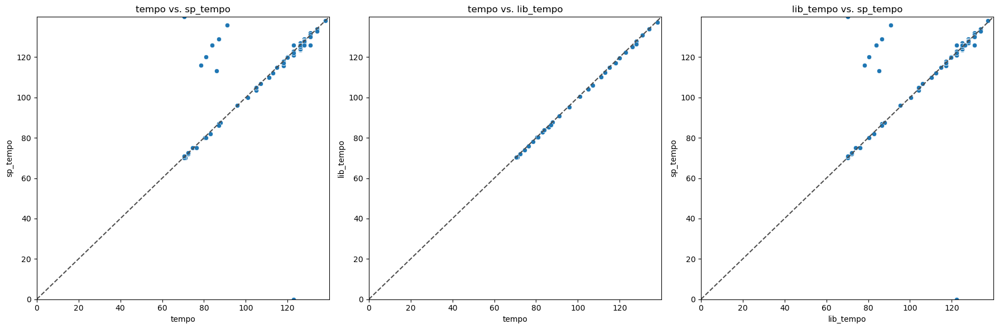

In [24]:
from scipy.stats import ttest_rel

df_chorus = pd.read_csv('../data/dataframes/results2.csv')

# Conduct paired t-tests
ttest_results = {
    'tempo_vs_sp_tempo': ttest_rel(df_chorus['tempo'], df_chorus['sp_tempo']),
    'tempo_vs_lib_tempo': ttest_rel(df_chorus['tempo'], df_chorus['lib_tempo']),
    'sp_tempo_vs_lib_tempo': ttest_rel(df_chorus['sp_tempo'], df_chorus['lib_tempo'])
}

# Print out t-test results
for key, result in ttest_results.items():
    print(f"{key}: statistic={result.statistic}, p-value={result.pvalue}")

# Determine common axis limits for all scatter plots
all_tempo_data = pd.concat([df_chorus['tempo'], df_chorus['sp_tempo'], df_chorus['lib_tempo']])
common_min = all_tempo_data.min()
common_max = all_tempo_data.max()

# Create scatter plots to compare tempo estimations
plt.figure(figsize=(18, 6))

# Plot 1: tempo vs. sp_tempo
plt.subplot(1, 3, 1)
sns.scatterplot(x='tempo', y='sp_tempo', data=df_chorus)
plt.xlim(common_min, common_max)
plt.ylim(common_min, common_max)
plt.plot([common_min, common_max], [common_min, common_max], ls="--", c=".3")
plt.title('tempo vs. sp_tempo')

# Plot 2: tempo vs. lib_tempo
plt.subplot(1, 3, 2)
sns.scatterplot(x='tempo', y='lib_tempo', data=df_chorus)
plt.xlim(common_min, common_max)
plt.ylim(common_min, common_max)
plt.plot([common_min, common_max], [common_min, common_max], ls="--", c=".3")
plt.title('tempo vs. lib_tempo')

# Plot 3: lib_tempo vs. sp_tempo
plt.subplot(1, 3, 3)
sns.scatterplot(x='lib_tempo', y='sp_tempo', data=df_chorus)
plt.xlim(common_min, common_max)
plt.ylim(common_min, common_max)
plt.plot([common_min, common_max], [common_min, common_max], ls="--", c=".3")
plt.title('lib_tempo vs. sp_tempo')

plt.tight_layout()
plt.show()

### Calculating Mean Absolute Percentage Error (MAPE)
Here we calculate the Mean Absolute Percentage Error (MAPE) using Spotify's tempo, sp_tempo, as the 'ground truth', and compare our tempo, 'tempo', and Librosa's tempo, 'lib_tempo', to this ground truth. We'll create precision windows indicating tempo matches within a range of 1% and 5% of the ground truth.

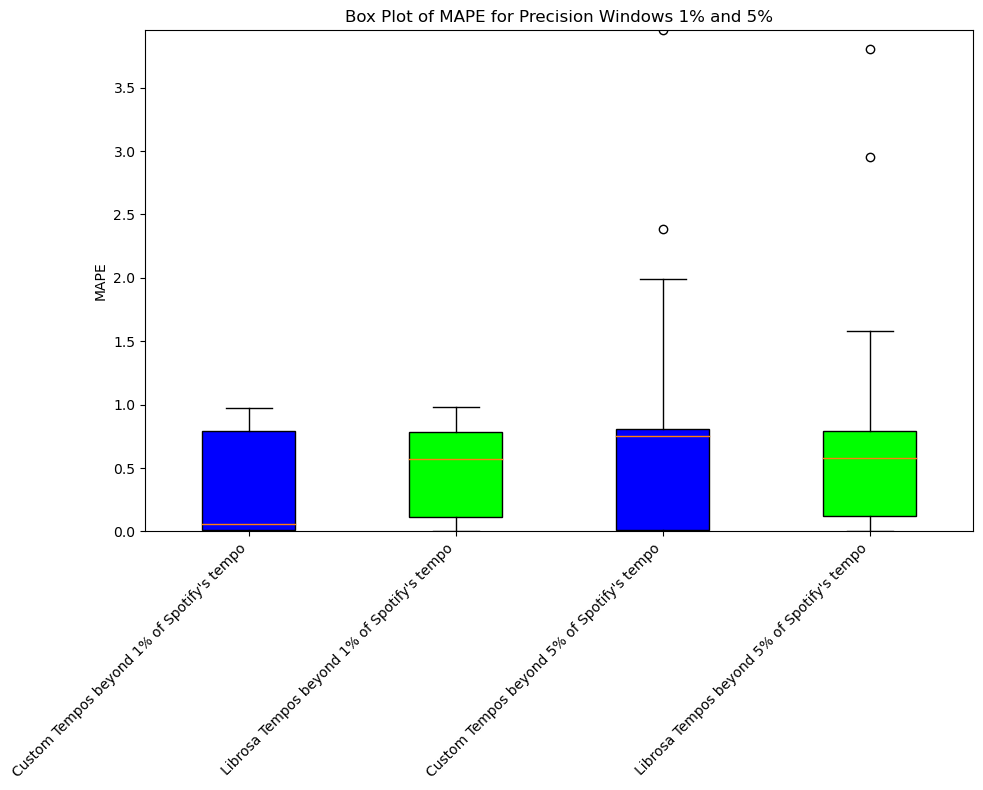

In [40]:
# Define a function to calculate MAPE within a precision window
def calculate_mape(actual, estimated, precision_window):
    error_within_precision = abs(actual - estimated) <= (actual * precision_window / 100)
    mape_within_precision = 100 * abs(actual - estimated) / actual
    mape_within_precision = mape_within_precision[error_within_precision]
    return mape_within_precision

# Precision windows to use for the modified graph
precision_windows = [1, 5]

# Calculate MAPE for each precision window and store the results in a dictionary
mape_results = {pw: [] for pw in precision_windows}
for pw in precision_windows:
    mape_results[pw].append(calculate_mape(df_chorus['sp_tempo'], df_chorus['tempo'], pw))
    mape_results[pw].append(calculate_mape(df_chorus['sp_tempo'], df_chorus['lib_tempo'], pw))

# Flatten the list of arrays to compute the global maximum MAPE
flatten_mape = [mape for sublist in mape_results.values() for mape in sublist]
max_mape = max(np.max(mape) for mape in flatten_mape if len(mape) > 0)

# Plotting the box plots
fig, ax = plt.subplots(figsize=(10, 8))

# Prepare data for boxplot
data_to_plot = []
xtick_labels = []
for pw in precision_windows:
    data_to_plot.append(mape_results[pw][0])  # For 'tempo' at precision window pw
    data_to_plot.append(mape_results[pw][1])  # For 'lib_tempo' at precision window pw
    xtick_labels.append(f"Custom Tempos beyond {pw}% of Spotify's tempo")  # Label for 'tempo'
    xtick_labels.append(f"Librosa Tempos beyond {pw}% of Spotify's tempo")  # Label for 'lib_tempo'

# Create boxplot
bp = ax.boxplot(data_to_plot, patch_artist=True)

# Set colors for each box
colors = ['#0000FF', '#00FF00']
for i, box in enumerate(bp['boxes']):
    box.set_facecolor(colors[i % len(colors)])  # Cycle through the color list

# Set x-tick labels
ax.set_xticklabels(xtick_labels, rotation=45, ha='right')

# Set the y-axis limit to the max of the MAPE results
ax.set_ylim(0, max_mape)

# Set titles and labels
ax.set_title('Box Plot of MAPE for Precision Windows 1% and 5%')
ax.set_ylabel('MAPE')

plt.tight_layout()
plt.show()

#### MAPE interpretations
- 'Tempo' has high accuracy with small errors: At very tight tolerances (1%), the 'tempo' predictions are very accurate (assuming Spotify's tempo is 'ground truth'), suggesting that when the model is wrong, it's typically only off by a very small margin.
- 'Tempo' has a lower MAPE than 'lib_tempo' at a 1% precision window but a higher MAPE at a 5% precision window, this could imply:
    - 'tempo' might be more accurate for applications that require very high precision (within 1% of the actual tempo).
    - 'lib_tempo' might have fewer instances of large deviations from the actual tempo.

### Assessing Label Validity and Tempo Estimation Accuracy

---
We use the absolute value of the **Mean Error** to assess the validity of labeled data (in this case, the timing of chorus start and end points). The Mean Error represents the discrepancy (in seconds) between the chorus start or end time and the nearest meter in the grids derived from 'tempo', 'lib_tempo', and 'sp_tempo'. Since choruses were labeled specifically to start and end on the first downbeat of their respective meters, a low mean error indicates that the labels are true to their labeling method. 

The tempo estimation method that results in the lowest mean error is the one that we will use going forward.

In [502]:
import numpy as np
from math import sqrt
from scipy.stats import pearsonr
from scipy.signal import correlate

def find_nearest(grid, point):
    """Find the nearest grid point to a given time point."""
    return min(grid, key=lambda x: abs(x - point))

def calculate_me(start_time, end_time, grid):
    """Calculate the Mean Error for start and end times against a grid."""
    if not grid:  # Check if the grid is empty
        return None
    start_error = abs(start_time - find_nearest(grid, start_time))
    end_error = abs(end_time - find_nearest(grid, end_time))
    return (start_error + end_error) / 2

def calculate_mse(start_time, end_time, grid):
    """Calculate the Mean Squared Error for start and end times against a grid."""
    if not grid:  
        return None
    start_error = (start_time - find_nearest(grid, start_time)) ** 2
    end_error = (end_time - find_nearest(grid, end_time)) ** 2
    return (start_error + end_error) / 2

def calculate_rmse(start_time, end_time, grid):
    """Calculate the Root Mean Squared Error for start and end times against a grid."""
    if not grid:
        return None
    start_error = (start_time - find_nearest(grid, start_time)) ** 2
    end_error = (end_time - find_nearest(grid, end_time)) ** 2
    mean_squared_error = (start_error + end_error) / 2
    return sqrt(mean_squared_error)

grid_types = ['beat_grid', 'lib_beat_grid', 'sp_beat_grid', 'bar_grid', 'lib_bar_grid', 'sp_bar_grid']
metrics = ['ME', 'MSE', 'RMSE']

for grid_type in grid_types:
    df_chorus[f'ME_{grid_type}'] = df_chorus.apply(lambda row: calculate_me(row['start_time'], row['end_time'], row[grid_type]), axis=1)
    df_chorus[f'MSE_{grid_type}'] = df_chorus.apply(lambda row: calculate_mse(row['start_time'], row['end_time'], row[grid_type]), axis=1)
    df_chorus[f'RMSE_{grid_type}'] = df_chorus.apply(lambda row: calculate_rmse(row['start_time'], row['end_time'], row[grid_type]), axis=1)

metrics_summary = pd.DataFrame()

for grid in grid_types:
    for metric in metrics:
        column_name = f"{metric}_{grid}"
        metrics_summary.loc['mean', column_name] = df_chorus[column_name].mean()
        metrics_summary.loc['std', column_name] = df_chorus[column_name].std()
        metrics_summary.loc['min', column_name] = df_chorus[column_name].min()
        metrics_summary.loc['25%', column_name] = df_chorus[column_name].quantile(0.25)
        metrics_summary.loc['median', column_name] = df_chorus[column_name].median()
        metrics_summary.loc['75%', column_name] = df_chorus[column_name].quantile(0.75)
        metrics_summary.loc['max', column_name] = df_chorus[column_name].max()

metrics_summary

,ME_beat_grid,MSE_beat_grid,RMSE_beat_grid,ME_lib_beat_grid,MSE_lib_beat_grid,RMSE_lib_beat_grid,ME_sp_beat_grid,MSE_sp_beat_grid,RMSE_sp_beat_grid,ME_bar_grid,MSE_bar_grid,RMSE_bar_grid,ME_lib_bar_grid,MSE_lib_bar_grid,RMSE_lib_bar_grid,ME_sp_bar_grid,MSE_sp_bar_grid,RMSE_sp_bar_grid
mean,0.142601,2.616882e-01,0.160543,0.150392,0.263744,0.168710,0.129167,2.595689e-01,0.142305,0.524438,0.876996,0.579047,0.565418,0.903514,0.615910,0.441218,7.586063e-01,0.486989
std,0.349611,4.655085e+00,0.486037,0.348031,4.709377,0.485384,0.352154,4.692191e+00,0.489532,0.577133,6.349057,0.736498,0.571963,6.720455,0.724483,0.556919,6.574152e+00,0.722602
min,0.000750,5.625000e-07,0.000750,0.010000,0.000100,0.010022,0.000820,6.831749e-07,0.000827,0.007000,0.000049,0.007000,0.010000,0.000111,0.010541,0.000820,6.831749e-07,0.000827
25%,0.063347,4.442435e-03,0.066652,0.081333,0.008805,0.093834,0.034805,1.435494e-03,0.037888,0.169901,0.039574,0.198902,0.244500,0.069220,0.263097,0.070174,5.069892e-03,0.071203
median,0.117333,1.760380e-02,0.132679,0.130000,0.020560,0.143389,0.072939,6.017294e-03,0.077571,0.441810,0.232454,0.482135,0.494000,0.250224,0.500224,0.281938,8.118952e-02,0.284938
75%,0.168473,3.252401e-02,0.180344,0.173333,0.032367,0.179909,0.196109,3.925154e-02,0.198120,0.725539,0.545496,0.738577,0.756000,0.595370,0.771602,0.661225,4.513170e-01,0.671801
max,7.432203,1.083579e+02,10.409508,7.528000,111.490000,10.558883,7.435066,1.105266e+02,10.513161,8.813785,149.070990,12.209463,9.452000,162.477008,12.746647,8.960270,1.516820e+02,12.315926


In [503]:
# We're only interested in these 
metrics_summary[['ME_bar_grid', 'ME_lib_bar_grid', 'ME_sp_bar_grid', 'RMSE_bar_grid', 'RMSE_lib_bar_grid', 'RMSE_sp_bar_grid']]

,ME_bar_grid,ME_lib_bar_grid,ME_sp_bar_grid,RMSE_bar_grid,RMSE_lib_bar_grid,RMSE_sp_bar_grid
mean,0.524438,0.565418,0.441218,0.579047,0.615910,0.486989
std,0.577133,0.571963,0.556919,0.736498,0.724483,0.722602
min,0.007000,0.010000,0.000820,0.007000,0.010541,0.000827
25%,0.169901,0.244500,0.070174,0.198902,0.263097,0.071203
median,0.441810,0.494000,0.281938,0.482135,0.500224,0.284938
75%,0.725539,0.756000,0.661225,0.738577,0.771602,0.671801
max,8.813785,9.452000,8.960270,12.209463,12.746647,12.315926


### Box Plots for ME, RMSE of Beat and Bar Alignments

---

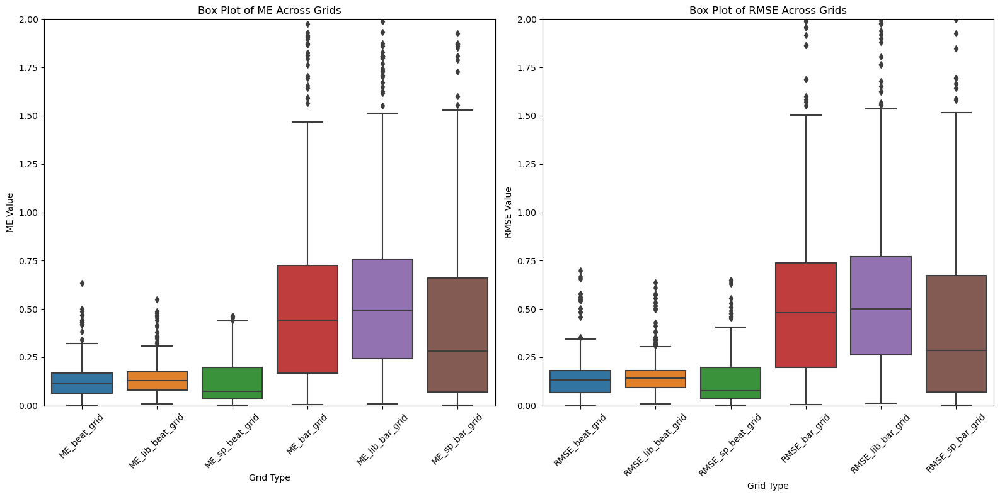

In [504]:
plt.figure(figsize=(16, 8))  # Adjust the overall figure size as needed

# Subplot 1 for ME
plt.subplot(1, 2, 1)  # Adjusted to 1 row, 2 columns, first subplot
me_columns = [f"ME_{grid}" for grid in grid_types]
sns.boxplot(data=df_chorus[me_columns])
plt.title('Box Plot of ME Across Grids')
plt.xticks(rotation=45)
plt.xlabel('Grid Type')
plt.ylabel('ME Value')
plt.ylim(0, 2)  # Adjust the y-axis range as needed

# Subplot 2 for RMSE
plt.subplot(1, 2, 2)  # Adjusted to 1 row, 2 columns, second subplot
rmse_columns = [f"RMSE_{grid}" for grid in grid_types]
sns.boxplot(data=df_chorus[rmse_columns])
plt.title('Box Plot of RMSE Across Grids')
plt.xticks(rotation=45)
plt.xlabel('Grid Type')
plt.ylabel('RMSE Value')
plt.ylim(0, 2)  # Adjust the y-axis range as needed

plt.tight_layout()
plt.show()

---

### Comparing ME of Beat times vs Bar times
#### Beat times is expected to have a lower ME than Bar/Meter times because Bar/Meter times are a subset of Beat times (e.g. a meter index every 4 beats). 

In [505]:
# Create a simplified DataFrame for demonstration
data_beats_vs_bars = {
    'ME': np.concatenate([df_chorus['ME_beat_grid'].dropna(), df_chorus['ME_bar_grid'].dropna()]),
    'Type': ['Beat'] * len(df_chorus['ME_beat_grid'].dropna()) + ['Bar'] * len(df_chorus['ME_bar_grid'].dropna())
}
df_beats_vs_bars = pd.DataFrame(data_beats_vs_bars)

# Conducting ANOVA to check if there's a significant difference between Beat and Bar MEs
f_value_beats_bars, p_value_beats_bars = stats.f_oneway(df_beats_vs_bars[df_beats_vs_bars['Type'] == 'Beat']['ME'],
                                                        df_beats_vs_bars[df_beats_vs_bars['Type'] == 'Bar']['ME'])

print(f"\nANOVA Test Results for Beats vs. Bars:\nF-Value: {f_value_beats_bars}\nP-Value: {p_value_beats_bars}")

# If significant, you could explore further or directly interpret
if p_value_beats_bars < 0.05:
    print("Significant differences observed between Beat and Bar MEs, indicating that Beat times might indeed be lower as expected.")
else:
    print("No significant differences observed between Beat and Bar MEs.")


ANOVA Test Results for Beats vs. Bars:
F-Value: 238.24464925492921
P-Value: 5.765620908094358e-50
Significant differences observed between Beat and Bar MEs, indicating that Beat times might indeed be lower as expected.


### ANOVA Comparing Mean Difference in Bar-Chorus Alignment as a Result of Tempo Estimation Method

In [516]:
from scipy import stats
import numpy as np
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import pandas as pd  

# Filter to include only bar grids
bar_grid_types = [grid for grid in grid_types if "bar_grid" in grid]

# Update ME columns to include only those for bar grids
bar_me_columns = [f"ME_{grid}" for grid in bar_grid_types]

# Preparing a list of ME values for each bar grid to use in ANOVA
bar_me_values_per_grid = [df_chorus[col].dropna() for col in bar_me_columns]

# Conducting ANOVA for bar grids only
f_value, p_value = stats.f_oneway(*bar_me_values_per_grid)

print(f"ANOVA Test Results for Bar Grids:\nF-Value: {f_value}\nP-Value: {p_value}")

# Interpreting the results of ANOVA
if p_value < 0.05:
    print("There is a statistically significant difference between the means of the bar grids. Proceeding with Tukey HSD test...")
    
    # Flatten ME values and corresponding bar grid labels into arrays for Tukey HSD test
    bar_me_values = np.concatenate(bar_me_values_per_grid)
    bar_grids = np.array([grid for grid, me_column in zip(bar_grid_types, bar_me_columns) for _ in range(len(df_chorus[me_column].dropna()))])
    
    tukey_result_bar = pairwise_tukeyhsd(endog=bar_me_values, groups=bar_grids, alpha=0.05)
    print("\nTukey HSD Test Results for Bar Grids:")
    print(tukey_result_bar)

    # Print detailed interpretation for each comparison among bar grids
    print("\nDetailed Comparison Among Bar Grids:")
    for result in tukey_result_bar.summary().data[1:]:
        print(f"Comparison between {result[0]} and {result[1]}: Mean Difference = {result[2]:.3f}, p-value = {result[3]:.3f}")
        if result[6]:
            print("  - The difference is statistically significant.\n")
        else:
            print("  - The difference is not statistically significant.\n")

ANOVA Test Results for Bar Grids:
F-Value: 9.18949445831228
P-Value: 0.00010603244583750501
There is a statistically significant difference between the means of the bar grids. Proceeding with Tukey HSD test...

Tukey HSD Test Results for Bar Grids:
      Multiple Comparison of Means - Tukey HSD, FWER=0.05      
   group1       group2    meandiff p-adj   lower  upper  reject
---------------------------------------------------------------
    bar_grid lib_bar_grid    0.041 0.3465 -0.0282 0.1101  False
    bar_grid  sp_bar_grid  -0.0832 0.0135 -0.1524 -0.014   True
lib_bar_grid  sp_bar_grid  -0.1242 0.0001 -0.1934 -0.055   True
---------------------------------------------------------------

Detailed Comparison Among Bar Grids:
Comparison between bar_grid and lib_bar_grid: Mean Difference = 0.041, p-value = 0.346
  - The difference is not statistically significant.

Comparison between bar_grid and sp_bar_grid: Mean Difference = -0.083, p-value = 0.013
  - The difference is statistically s

The tempos derived by Spotify's API achieved a significantly lower mean error than the other two methods suggesting that their tempo estimation method creates meter grids more aligned with the song's rhythmic structure than the other two methods. No significant differences were found between my custom tempo estimation method and the one provided by Librosa, which is not surprising given that my custom implementation was only a slight deviation from the one provided by Librosa.

---

## Audio Feature Extraction and Visualization
In this section, we will extract various audio features and visualize them to help us understand which features are pertinent in audio segmentation.

In [165]:
import random
import pickle
import numpy as np
import pandas as pd
import librosa
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.lines as mlines

# Load sample audio file
def load_pickle(file_path):
    with open(file_path, 'rb') as f:
        return pickle.load(f)
    
def adjust_tempo_values(*tempo_values):
    """Adjusts tempo values based on specified logic."""
    adjusted_tempos = []
    for tempo in tempo_values:
        if tempo > 140:
            adjusted_tempos.append(tempo / 2)
        elif tempo < 70:
            adjusted_tempos.append(tempo * 2)
        else:
            adjusted_tempos.append(tempo)
    return adjusted_tempos

def generate_beats_and_meters(first_beat_time, tempo, time_signature_num, duration):
    """Generate beat and measure grids within the duration of a song."""
    seconds_per_beat = 60.0 / tempo
    beats_per_measure = time_signature_num
    seconds_per_measure = seconds_per_beat * beats_per_measure
    beat_grid_forward = [first_beat_time + i * seconds_per_beat for i in range(int((duration - first_beat_time) / seconds_per_beat))]
    beat_grid_backward = [first_beat_time - i * seconds_per_beat for i in range(1, int(first_beat_time / seconds_per_beat) + 1)]
    beat_grid_backward.reverse()
    beat_grid = beat_grid_backward + beat_grid_forward
    measure_grid_forward = [first_beat_time + i * seconds_per_measure for i in range(int((duration - first_beat_time) / seconds_per_measure))]
    measure_grid_backward = [first_beat_time - i * seconds_per_measure for i in range(1, int(first_beat_time / seconds_per_measure) + 1)]
    measure_grid_backward.reverse()
    measure_grid = measure_grid_backward + measure_grid_forward

    return beat_grid, measure_grid

    
X_test = load_pickle('../data/pkl/test_data.pkl')
random.seed(42)
random_song_id = int(random.choice(list(X_test.keys())))
audio_file = f'../data/audio_files/processed/{random_song_id}.mp3'
df = pd.read_csv('../data/dataframes/clean_labeled.csv')
data = df.loc[df['SongID'] == random_song_id]

# Load audio file
y, sr = librosa.load(audio_file, sr=None)
y_harm, y_perc = librosa.effects.hpss(y)

# Extract audio features
duration = librosa.get_duration(y=y, sr=sr)

# Beat tracking with custom function
tempo, beats = librosa.beat.beat_track(y=y_perc, sr=sr, hop_length=512)

# Spotify's tempo, if available, else fallback to Librosa's estimate
tempo = data['sp_tempo'].iloc[0] if not pd.isnull(data['sp_tempo'].iloc[0]) else tempo

# Adjust tempo values as needed
tempo = adjust_tempo_values(tempo)[0]

# Time signature handling
time_signature = data['sp_time_signature'].iloc[0] if not pd.isnull(data['sp_time_signature'].iloc[0]) else 4
time_signature = int(time_signature) if time_signature != 0 else 4

# Beat and meter grids
beat_times = librosa.frames_to_time(beats, sr=sr, hop_length=512)
beat_grid, meter_grid = generate_beats_and_meters(beat_times[0], tempo, time_signature, duration) 

In [99]:
# Function to overlay meter grid and chorus segments on visualizations
def overlay_meter_chorus(ax, meter_grid, data):
    """Overlay meter grid and chorus segments on visualizations."""
    chorus_data = data.loc[data['label'] == 'chorus']
    y_min, y_max = ax.get_ylim()
    for j, row in enumerate(chorus_data.iterrows()):
        ax.fill_between(x=[row[1]['start_time'], row[1]['end_time']], y1=y_min, y2=y_max, 
                        color='green', alpha=0.3, label='Chorus' if j == 0 else None)
        
    for i, meter in enumerate(meter_grid):
        ax.axvline(x=meter, color='grey', linestyle=':', linewidth=2 if i % 4 == 0 else 1, 
                   label='Every 4th Meter' if i == 0 else 'Meter' if i == 1 else None)

### Initial Waveform Visualization with Meter Grid and Chorus Overlay
- By visualizing the audio features over a meter grid, it becomes easier to spot naturally occuring segmentation and patterns that occur on a per-meter basis or over a multiple of 4 meters, which is common in many musical forms.
- Labeled chorus segments are highlighted in green blocks so we can see how certain audio feature illuminate them.

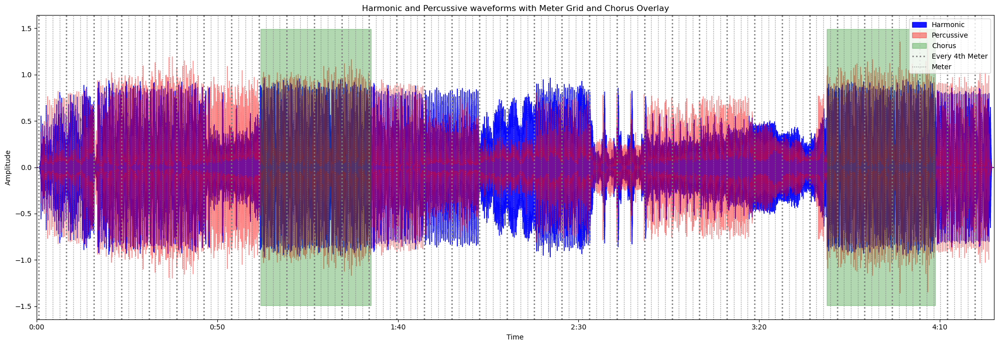

In [98]:
fig, ax = plt.subplots(figsize=(20, 7))
librosa.display.waveshow(y_harm, sr=sr, alpha=0.9, ax=ax, label='Harmonic', color='b')
librosa.display.waveshow(y_perc, sr=sr, alpha=0.4, ax=ax, label='Percussive', color='r')
overlay_meter_chorus(ax, meter_grid, data)

# Set labels and title
ax.set_xlim([0, duration])
ax.set_ylabel('Amplitude')
ax.set_title('Harmonic and Percussive waveforms with Meter Grid and Chorus Overlay')

# Create legend from proxy artists
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles)
plt.tight_layout()
plt.show()

##### Here we can see how the meter grid attempts to partition the song into meaningful units. Every 4th meter is emphasized because motifs and patterns tend to unfold in multiples of 4 meters in pop songs. 

---

### RMS Energy
- RMS energy, or Root Mean Square energy, is a measure of the power content of an audio signal. 
- It represents the square root of the average power of the signal's amplitude squared over a period of time. 
- RMS energy can be used as an indicator of the loudness of an audio signal. 
- RMS energy is often used in music analysis, audio engineering, and sound processing applications to assess the dynamic range and to normalize audio tracks.

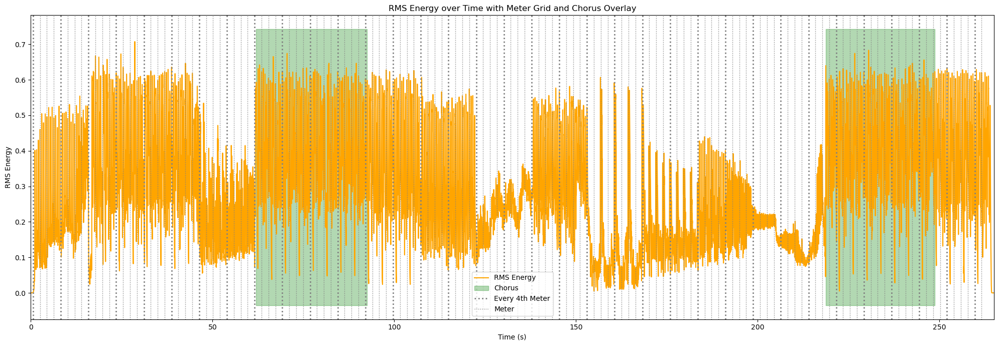

In [100]:
# Compute the RMS energy
rms = librosa.feature.rms(y=y)[0]

# Generate time axis for plotting
frames = range(len(rms))
t = librosa.frames_to_time(frames, sr=sr)

# Plot the RMS energy
fig, ax = plt.subplots(figsize=(20, 7))
ax.plot(t, rms, color='orange', label='RMS Energy')

# Overlay meter grid and chorus segments
overlay_meter_chorus(ax, meter_grid, data)

# Set labels and title
ax.set_xlim([0, duration])
ax.set_xlabel('Time (s)')
ax.set_ylabel('RMS Energy')
ax.set_title('RMS Energy over Time with Meter Grid and Chorus Overlay')

# Create legend from proxy artists
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles)

plt.tight_layout()
plt.show()

### RMS Visualization Analysis
- We can see a natural break point in the RMS energy at the onset of the chorus.
- However, we cannot determine where the chorus ends solely with RMS energy in this particular song.

---

### Melspectrogram Visualization
- The Mel-spectrogram captures both spectral and temporal characteristics of music. 

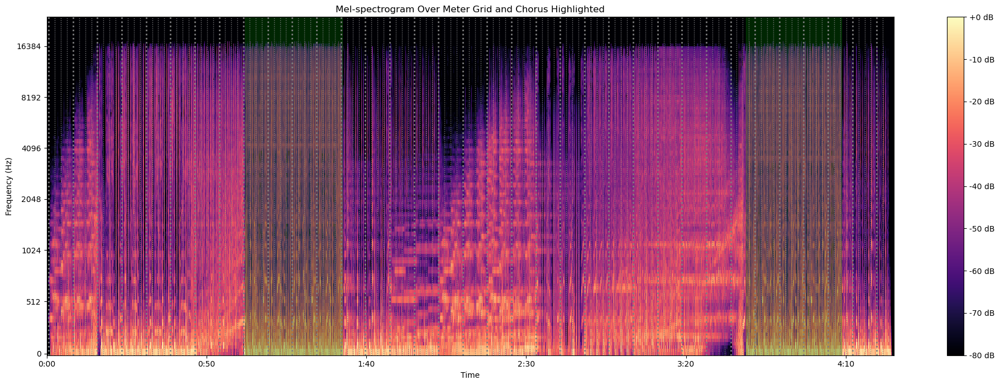

In [107]:
S = librosa.feature.melspectrogram(y=y, sr=sr)
log_S = librosa.power_to_db(S, ref=np.max)

# Plot the Mel-spectrogram
fig, ax = plt.subplots(figsize=(20, 7))
img = librosa.display.specshow(log_S, sr=sr, x_axis='time', y_axis='mel', ax=ax)
overlay_meter_chorus(ax, meter_grid, data)
# Set labels and title
ax.set_xlim([0, librosa.get_duration(y=y, sr=sr)])  # Set the x-axis limits to the duration of the audio
ax.set_ylabel('Frequency (Hz)')
ax.set_title('Mel-spectrogram Over Meter Grid and Chorus Highlighted')

# Display color bar
fig.colorbar(img, ax=ax, format="%+2.f dB")

plt.tight_layout()
plt.show()

#### Decomposed Mel-spectrogram using Non-negative Matrix Factorization
- Decomposing a mel-spectrogram using NMF reduces its dimensionality which can be beneficial for compression and reducing computational costs for machine learning.
- The decomposition can help in identifying recurring patterns or "templates" in the spectrogram, which can correspond to specific types of sounds or instruments.
- Decomposition can help in denoising the signal by separating the noise components from the signal components.

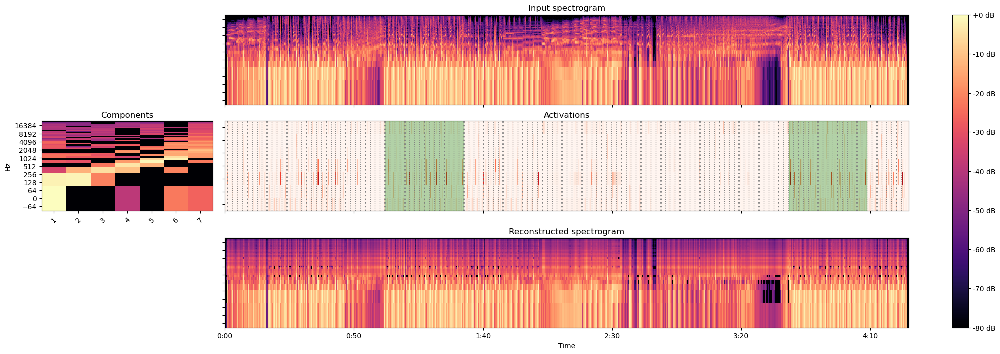

In [199]:
hop_length = 512  

# Compute the mel-spectrogram and decompose
S = librosa.feature.melspectrogram(y=y, sr=sr, hop_length=hop_length)
comps, acts = librosa.decompose.decompose(S, n_components=7, sort=True)

# Define the layout for subplots
layout = [
    ['.', 'A', 'A', 'A', 'A'],
    ['B', 'C', 'C', 'C', 'C'],
    ['.', 'D', 'D', 'D', 'D']
]

# Create the subplots with specified figure size
fig, ax = plt.subplot_mosaic(layout, figsize=(20, 7), constrained_layout=True)

# Display the original mel-spectrogram
librosa.display.specshow(librosa.power_to_db(S, ref=np.max),
                         y_axis='log', x_axis='time', ax=ax['A'], sr=sr, hop_length=hop_length)
ax['A'].set(title='Input spectrogram')
ax['A'].label_outer()

# Display the components without transposing
librosa.display.specshow(librosa.power_to_db(comps, ref=np.max),
                         y_axis='log', ax=ax['B'], sr=sr, hop_length=hop_length)
ax['B'].set(title='Components')
# Set custom x-tick labels to denote component numbers
ax['B'].set_xticks(np.arange(comps.shape[1]))
ax['B'].set_xticklabels([f"{i+1}" for i in range(comps.shape[1])])
ax['B'].tick_params(axis='x', rotation=45)

# Display the activations with a red color map
librosa.display.specshow(acts, x_axis='time', ax=ax['C'], cmap='Reds', sr=sr, hop_length=hop_length)
ax['C'].set(ylabel='Component number', title='Activations')
# Set custom y-tick labels to denote component numbers
ax['C'].set_yticks(np.arange(acts.shape[0]))
ax['C'].set_yticklabels([f"{i+1}" for i in range(acts.shape[0])])
ax['C'].sharex(ax['A'])
ax['C'].label_outer()

# Assuming overlay_meter_chorus is a function you have defined to overlay data on the activations plot
overlay_meter_chorus(ax['C'], meter_grid, data)

# Reconstruct the spectrogram from the components and activations
S_approx = comps.dot(acts)

# Display the reconstructed spectrogram
img = librosa.display.specshow(librosa.power_to_db(S_approx, ref=np.max),
                               y_axis='log', x_axis='time', ax=ax['D'], sr=sr, hop_length=hop_length)
ax['D'].set(title='Reconstructed spectrogram')
ax['D'].sharex(ax['A'])
ax['D'].sharey(ax['A'])
ax['D'].label_outer()

# Add a colorbar to the figure
fig.colorbar(img, ax=list(ax.values()), format="%+2.f dB")

# Show the plot
plt.show()

#### Mel-spectrogram Analysis
- Visual break points are similar to the ones obserbed in RMS energy.
- With the added dimension of Frequency (Hz) there is potential for more granular analysis than what RMS can offer but the mel-spectrogram as is may be too high-dimensional to visually discern patterns in the music. 
- The activations of the decomposed Mel-spectrogram provide granular information at a lower dimensionality which can be useful for further analysis. The number of components may need to be emperically determined/optimized.
---

### Key-Invariant Chromagram
- A key-invariant chromagram is a type of musical feature representation that displays the intensity of the twelve different pitch classes (C, C#, D, ..., B) regardless of the octave, and is designed to be invariant to the key of the piece. This means that it aims to represent the same musical content in a way that is robust to transpositions, which is useful for deducing patterns across of varying keys. 
- Chromagrams have a resolution of one bin per pitch class, while Mel-spectrograms have a higher frequency resolution, with many bins covering the range of human hearing. This lower dimensionality makes them more suitable for tonal-based analysis

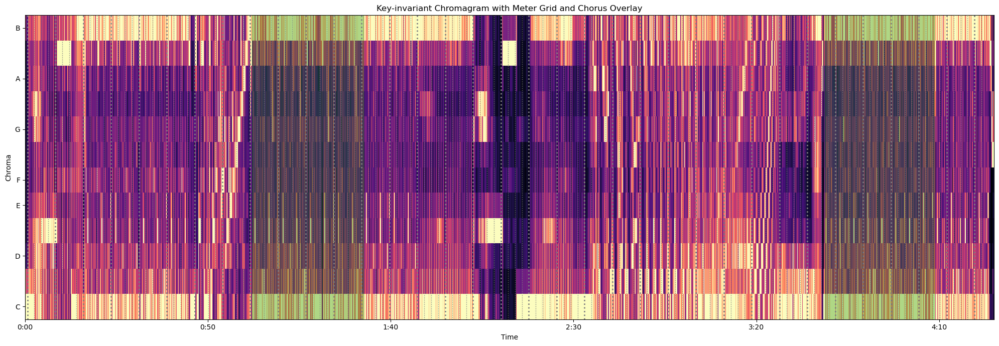

In [163]:
def calculate_ki_chroma(y, sr):
    """Calculate a key-invariant chromagram for a given audio waveform."""
    chromagram = librosa.feature.chroma_cqt(y=y, sr=sr, bins_per_octave=24)
    chroma_vals = np.sum(chromagram, axis=1)
    maj_profile = np.array([6.35, 2.23, 3.48, 2.33, 4.38, 4.09, 2.52, 5.19, 2.39, 3.66, 2.29, 2.88])
    min_profile = np.array([6.33, 2.68, 3.52, 5.38, 2.60, 3.53, 2.54, 4.75, 3.98, 2.69, 3.34, 3.17])
    maj_corrs = np.correlate(chroma_vals, maj_profile, mode='same')
    min_corrs = np.correlate(chroma_vals, min_profile, mode='same')
    key_shift = np.argmax(np.concatenate((maj_corrs, min_corrs))) % 12
    return np.roll(chromagram, -key_shift, axis=0)

chroma = calculate_ki_chroma(y_harm, sr)

fig, ax = plt.subplots(figsize=(20, 7))
librosa.display.specshow(chroma, sr=sr, hop_length=512, y_axis='chroma', x_axis='time')
overlay_meter_chorus(ax, meter_grid, data)
ax.set_ylabel('Chroma')
ax.set_title('Key-invariant Chromagram with Meter Grid and Chorus Overlay')

plt.tight_layout()
plt.show()

#### Beat-synced + Time-lagged + Key-invariant Chromagram

- A beat-synced chromagram reduces the temporal resolution to focus on the harmonic content of each beat, which can simplify the interpretation of the harmonic progression over time. This also helps smooth out rapid transitions or noise in the data, making patterns more discernible.
- By including information from past frames, stacking provides a broader temporal context and makes it easier to recognize patterns that span multiple time steps, which might be missed when looking at individual frames in isolation.
- For machine learning tasks, stacked features can improve the performance of classifiers by providing them with additional context that might be necessary to distinguish between similar classes.

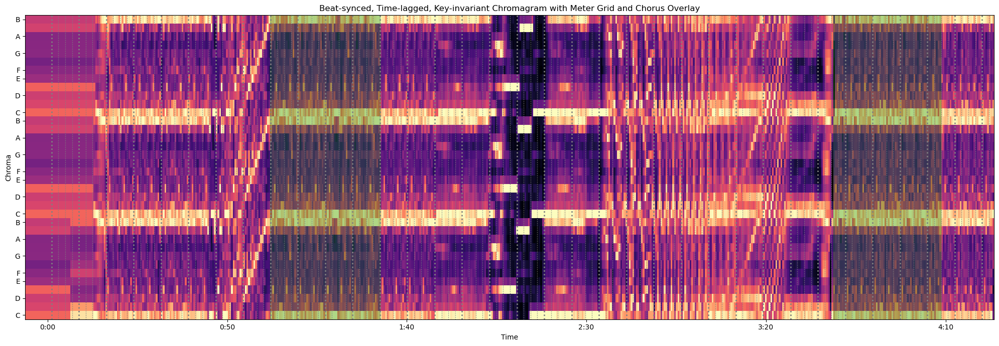

In [197]:
beats = librosa.util.fix_frames(beats, x_min=0)
chroma_sync = librosa.util.sync(chroma, beats)
chroma_lag = librosa.feature.stack_memory(chroma_sync, n_steps=3, mode='edge')

fig, ax = plt.subplots(figsize=(20, 7))
beat_times = librosa.frames_to_time(beats, sr=sr, hop_length=512)
librosa.display.specshow(chroma_lag, y_axis='chroma', x_axis='time',
                         x_coords=beat_times, ax=ax)
overlay_meter_chorus(ax, meter_grid, data)
ax.set_ylabel('Chroma')
ax.set_title('Beat-synced, Time-lagged, Key-invariant Chromagram with Meter Grid and Chorus Overlay')

plt.tight_layout()
plt.show()

#### Beat-synced + Time-lagged + Key-invariant Chromagram Analysis
- Harmonic patterns and segments are even easier to see than with a normal chromagram.
- The high resolution of a normal chromagram introduces noise that can be eliminated with beat-synced smoothing.

---


### Tempogram
- Tempograms provide information about the tempo of a signal over time. It is analogous to a spectrogram, which represents the spectrum of frequencies over time, but instead, a tempogram captures the tempo variations. In essence, a tempogram reflects how the tempo changes throughout a piece of music or any rhythmic audio signal.
- Although most songs are produced at a global tempo, tempograms are sensitive to subtle variations and arrangements of beats and downbeats. They may also reveal changes in rhythmic density or energy at a given time step (e.g. drum roll before a chorus drop). 
- Tempograms are considerded high-dimensional because they capture the intensity of tempos across a large window of tempos (e.g. 30-600 bpm). Given that a song typically does not contain a continuous range of tempos, tempogram decomposition may be warranted. 

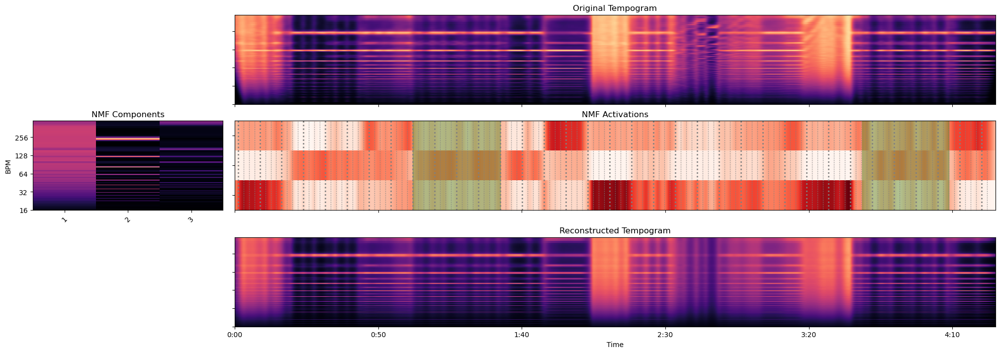

In [195]:
tempogram = librosa.feature.tempogram(y=y, sr=sr, hop_length=hop_length, win_length=600)
tempogram = np.clip(tempogram, 0, None)

# Decompose the tempogram using NMF
n_components = 3 
tempo_comps, tempo_acts = librosa.decompose.decompose(tempogram, n_components=n_components)

# Reconstruct the tempogram from the components and activations
tempogram_approx = np.dot(tempo_comps, tempo_acts)

# Define the layout for subplots
layout = [
    ['.', 'A', 'A', 'A', 'A'],
    ['B', 'C', 'C', 'C', 'C'],
    ['.', 'D', 'D', 'D', 'D']
]

# Create the subplots with specified figure size
fig, ax = plt.subplot_mosaic(layout, figsize=(20, 7), constrained_layout=True)

# Display the original tempogram
librosa.display.specshow(tempogram, sr=sr, hop_length=hop_length, x_axis='time', y_axis='tempo', ax=ax['A'])
ax['A'].set(title='Original Tempogram')
ax['A'].label_outer()

# Display the components
librosa.display.specshow(tempo_comps, sr=sr, y_axis='tempo', hop_length=hop_length, ax=ax['B'])
ax['B'].set(title='NMF Components')
ax['B'].set_xticks(np.arange(tempo_comps.shape[1]))
ax['B'].set_xticklabels([f"{i+1}" for i in range(tempo_comps.shape[1])])
ax['B'].tick_params(axis='x', rotation=45)

# Display the activations with a red color map
librosa.display.specshow(tempo_acts, x_axis='time', ax=ax['C'], cmap='Reds', sr=sr, hop_length=hop_length)
ax['C'].set(ylabel='Component number', title='NMF Activations')
ax['C'].set_yticks(np.arange(tempo_acts.shape[0]))
ax['C'].set_yticklabels([f"{i+1}" for i in range(tempo_acts.shape[0])])
ax['C'].sharex(ax['A'])
overlay_meter_chorus(ax['C'], meter_grid, data)
ax['C'].label_outer()

# Display the reconstructed tempogram
img = librosa.display.specshow(tempogram_approx, sr=sr, hop_length=hop_length, x_axis='time', y_axis='tempo', ax=ax['D'])
ax['D'].set(title='Reconstructed Tempogram')
ax['D'].sharex(ax['A'])
ax['D'].label_outer()

# Show the plot
plt.show()

#### Tempogram Analysis
In our specific instance, the tempogram doesn't really help us visually identify the chorus, however it does help us identify other segments of the piece. Tempograms also contain more dimensions than needed (as evident from the horizontal striations in the figure). Decomposing the tempogram into 3 components significantly reduces the number of dimensions and provides a better visualization of the rhythmic segmentation in the song. 

<style>
@import url('https://fonts.googleapis.com/css2?family=Lato:ital,wght@0,100;0,300;0,400;0,700;0,900;1,100;1,300;1,400;1,700;1,900&family=Merriweather:ital,wght@0,300;0,400;0,700;0,900;1,300;1,400;1,700;1,900&display=swap');

/* Apply the Lato font to body text */
body {
    font-family: 'Lato', sans-serif;
    font-size: 12px; /* Base font size for body text */
}

/* Heading styles with Merriweather */
h1 {
    font-family: 'Merriweather', serif;
    font-size: 36px;
    font-weight: 900; /* Merriweather's boldest weight for main headings */
}

h2 {
    font-family: 'Merriweather', serif;
    font-size: 24px;
    font-weight: 700; /* Bold weight for section headings */
}

h3 {
    font-family: 'Merriweather', serif;
    font-size: 14px;
    font-weight: 700; /* Bold weight for sub-section headings */
}

h4 {
    font-family: 'Merriweather', serif;
    font-size: 12px;
    font-weight: 700; /* Bold weight for sub-sub-section headings */
}
/* Additional styles can be added for h5, h6, or other elements as needed */
</style>